# A Framework for Leveraging LLMs for Scene Analysis and Cognitive Processing

In [1]:
import os
HOME = os.getcwd()

os.chdir(HOME)
print(HOME)

import sys
print(sys.executable)


/Users/berkayerkal/Desktop/human_patterns_exploration
/opt/anaconda3/envs/new_env/bin/python


In [2]:
from src.utils.sam_utils import download_model_weight, download_model_config

INSTALL = False
if INSTALL:
    download_model_weight("sam2.1_hiera_large.pt")
    download_model_config("sam2.1_hiera_l.yaml")
    !pip install sam2


In [3]:
import os
import pandas as pd
from src.core.FixationTask import FixationTask
from src.core.Participant import Participant
from src.core.ImageData import ImageData
from src.core.Mask import Mask
from src.models.MaskGenerator import SAM2

from src.prompts.gaze_prompts import *

In [4]:
import time

t0 = time.time(); import torch;        print("torch:", time.time()-t0)
t0 = time.time(); import sam2;         print("sam2:", time.time()-t0)
t0 = time.time(); import scipy;        print("scipy:", time.time()-t0)
t0 = time.time(); import src.core.FixationTask; print("FixationTask:", time.time()-t0)

torch: 1.8835067749023438e-05
sam2: 1.4781951904296875e-05
scipy: 1.2874603271484375e-05
FixationTask: 1.52587890625e-05


In [5]:
font_color =  "yellow"          
COLOR_CODE_1 = "fixation_scarletred_meddark"
COLOR_CODE_2 = "aluminium"
COLOR_CODE_3 = "yellow"

In [6]:

DATA_DIR = os.path.join(".", "data", "experiments")
IMAGE_DIR = os.path.join(".", "data", "images")
RESULTS_DIR = os.path.join(".", "outputs")

SAM_CONFIG = os.path.join(".", "configs", "sam2.1", "sam2.1_hiera_l.yaml")
SAM_MODEL =  os.path.join(".", "checkpoints", "sam2.1_hiera_large.pt")

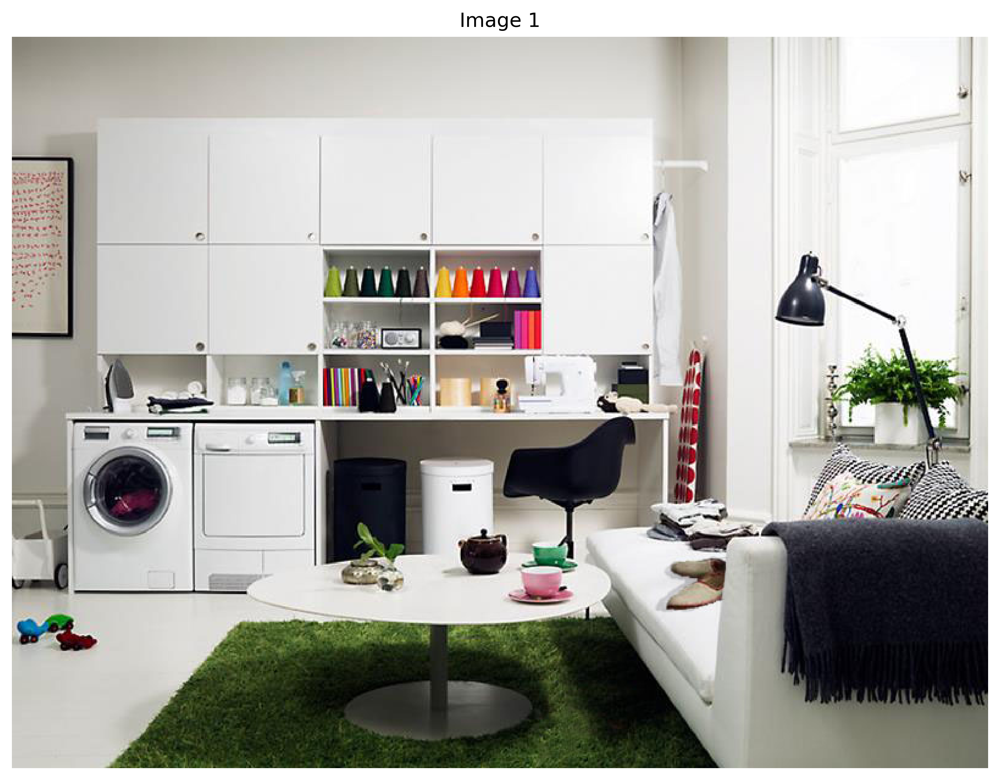

In [7]:
IMG_ID = 1
imgpath = os.path.join(IMAGE_DIR, f"{IMG_ID}unexp.jpg")
imageData = ImageData(imgpath)
imageData.show()

## Testing Gaze Points


In [8]:
datapath =  os.path.join("data", "experiments", "XSQ_Expt1_Data_All.csv")
data = pd.read_csv(datapath)

In [9]:
IMG_ID = 1
part_ID = int(data[data.ItemNum == IMG_ID].ParticipantID.unique()[0])
participant =  Participant(part_ID)
print("Participant ID:", part_ID)

imgpath = os.path.join(IMAGE_DIR, f"{IMG_ID}exp.jpg")
print("Image Path:", imgpath)

imageData = ImageData(imgpath, target = [430, 510, 545, 595], img_type = "exp")

CONDITION_ID = 1
GROUP_ID = 1
task = FixationTask(participant, imageData, data, condition = CONDITION_ID, group = GROUP_ID, rows_per_second=1)

Participant ID: 2
Image Path: ./data/images/1exp.jpg
Participant data before center bias removal:  4
Participant data after center bias removal:  3


In [10]:
task_data = task.data.copy()

In [11]:
prompt_0 = task_data.iloc[0]
prompt_1 = task_data.iloc[1]
prompt_2 = task_data.iloc[2]

### Point Gaze Prompt

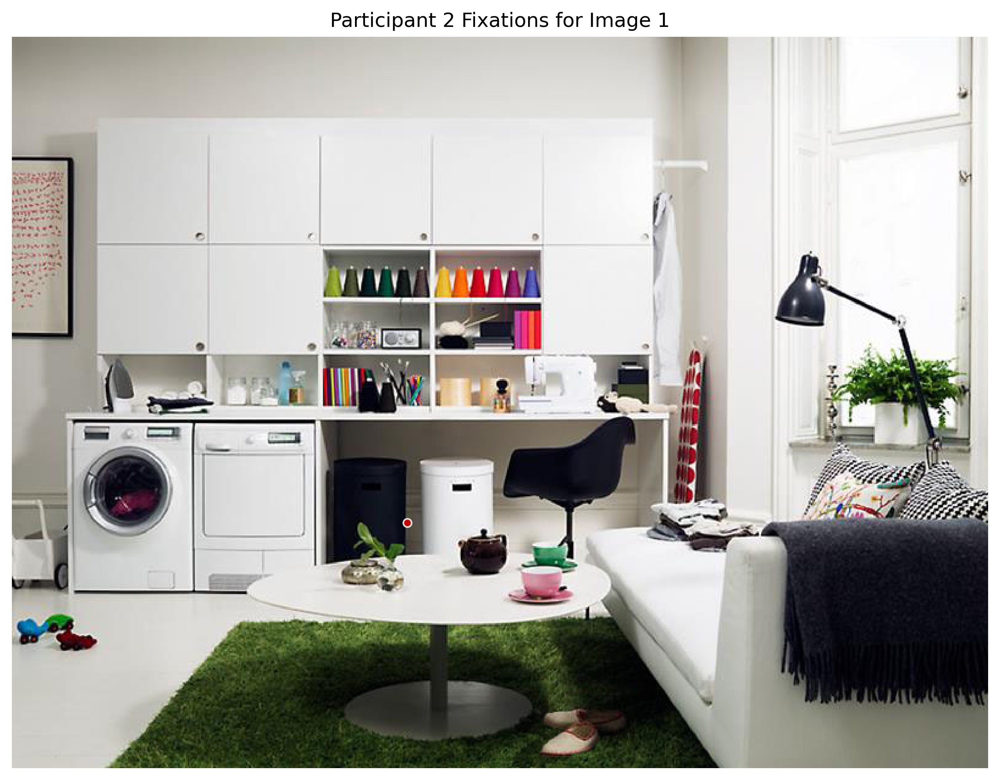

In [12]:
aug_task_data = sample_points_point(prompt_0)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

### Triangle Gaze Prompt

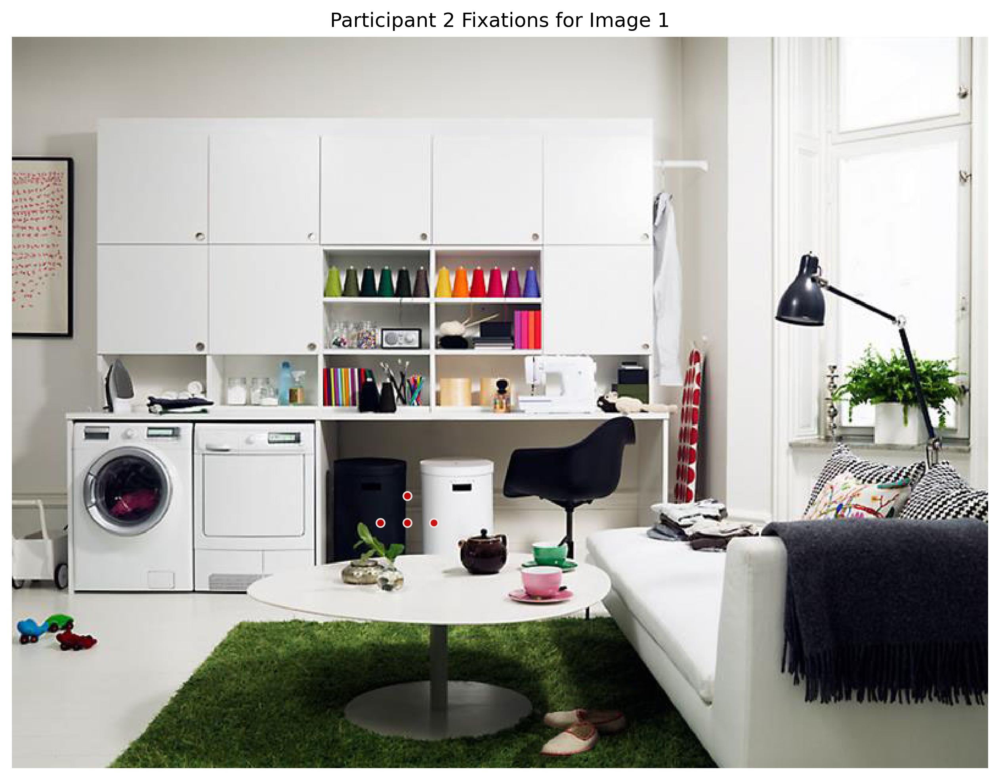

In [13]:
aug_task_data = sample_points_triangle(prompt_0)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

### Cross Gaze Prompt

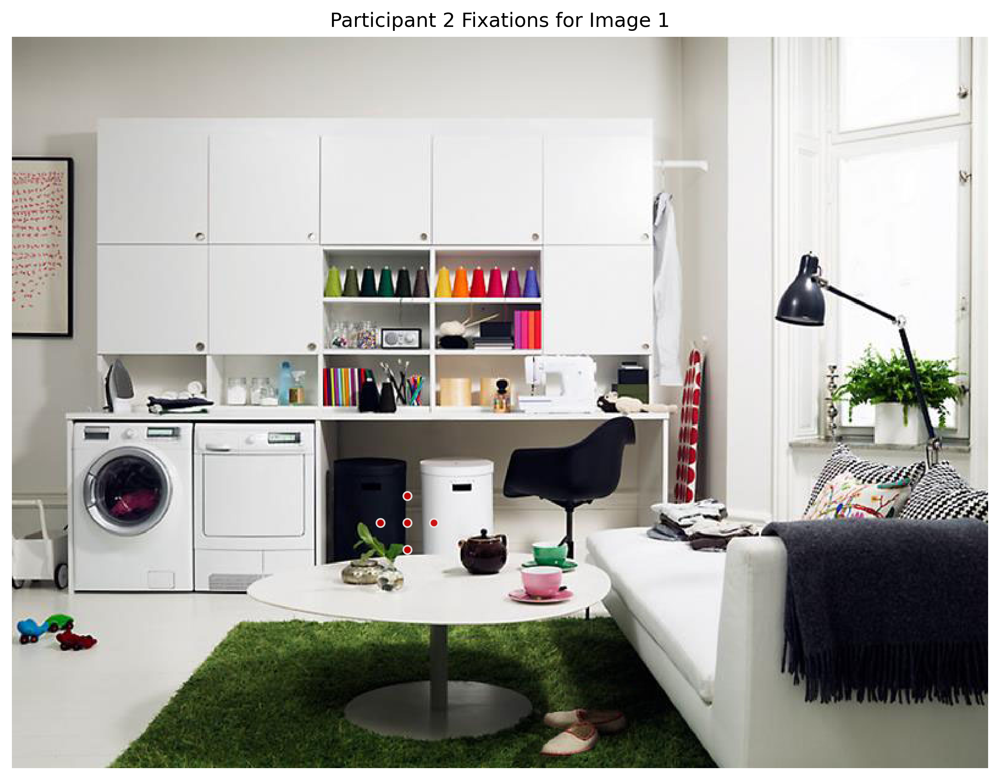

In [14]:
aug_task_data = sample_points_cross(prompt_0)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

### Circle Gaze Prompt

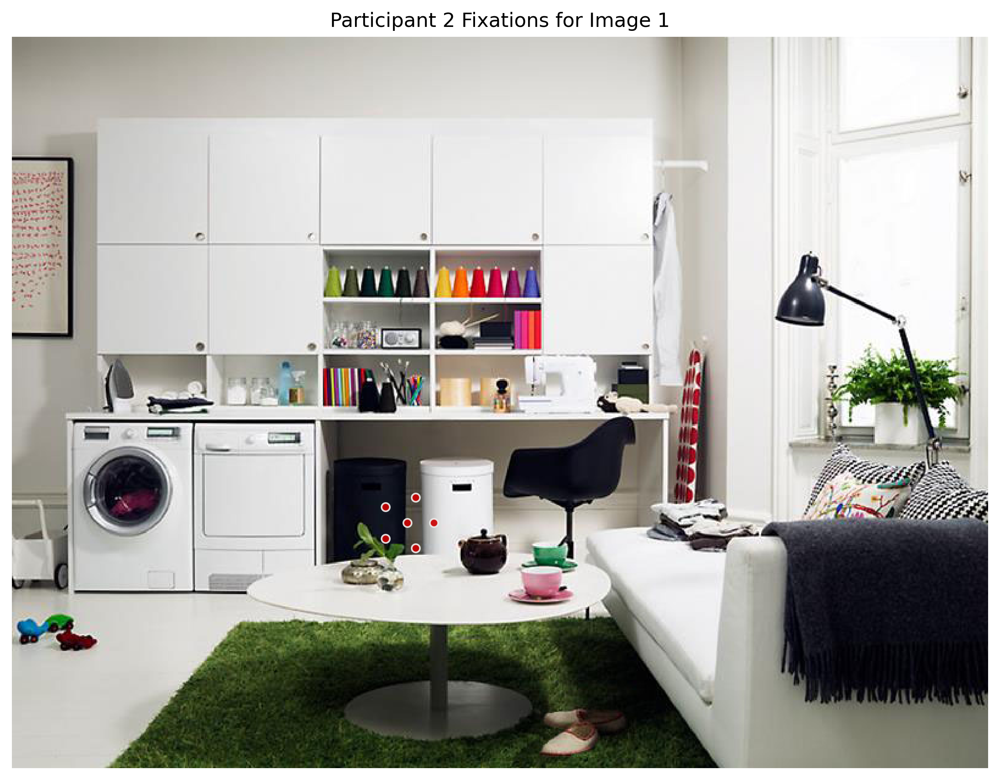

In [15]:
aug_task_data = sample_points_circle(prompt_0, N = 5)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

## Testing Mask Segmentation and Labeling

Generate the description for this scene

In [16]:
from src.models.LLM import LLM, OpenAI, Ollama
from src.models.Framework import SceneUnderstandingFramework
from src.utils.llm_utils import create_llm_instance

Will process images: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30)]
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 1, participant 5
	Generating general scene description…
Scene description completed in 10.76 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and a dryer are located on the left side of the image.
   -

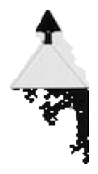

Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8884


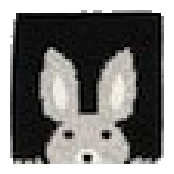

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6974


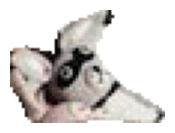

Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8349


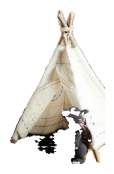

Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8653


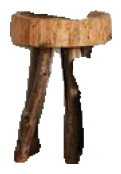

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.76 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8662


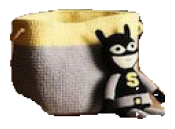

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6396


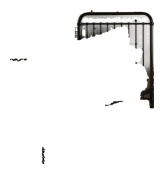

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 6, participant 103
	Generating general scene description…
Scene description completed in 14.44 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a mix of monochrome and yellow accents, creating a lively yet stylish atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed,

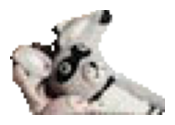

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9166


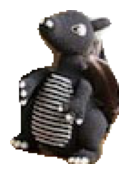

Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5250


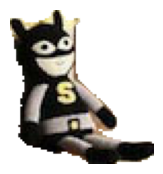

Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.78 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9748


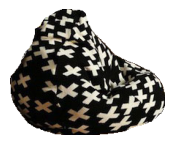

Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 2.08 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.74 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7254


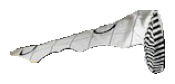

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.56 seconds
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Processing image 6, participant 105
	Generating general scene description…
Scene description completed in 13.54 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one w

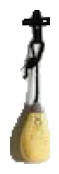

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.38 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9656


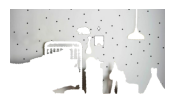

Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.81 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8462


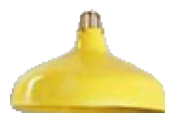

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.89 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8252


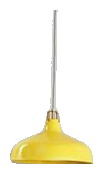

Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9359


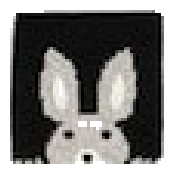

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.34 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9517


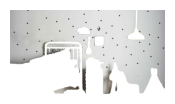

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.36 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 1.62 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 1.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9025


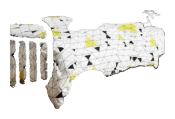

Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.50 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8757


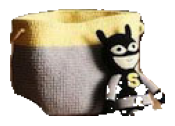

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9529


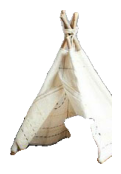

Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8804


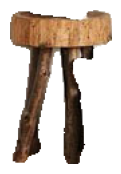

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9231


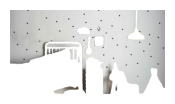

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.80 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8624


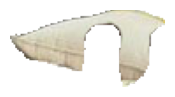

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.85 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.63 seconds
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Processing image 7, participant 5
	Generating general scene description…
Scene description completed in 11.91 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist aesthetic. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: On the bed, with one pillow having a deco

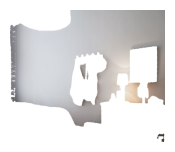

Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8282


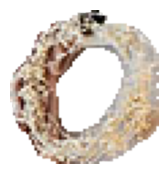

Mask labeling completed in 1.20 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.76 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.7681


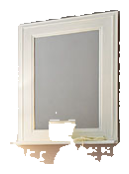

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8184


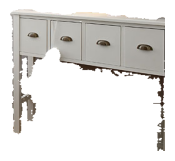

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6052


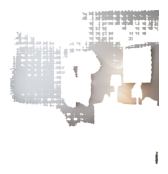

Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 1.33 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9534


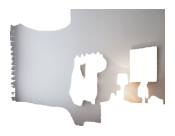

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8935


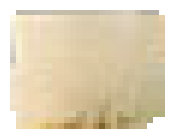

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.69 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9266


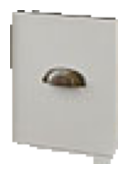

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9692


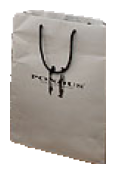

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9572


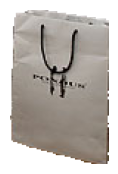

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9568


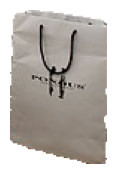

Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7808


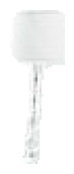

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.91 seconds
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Processing image 7, participant 6
	Generating general scene description…
Scene description completed in 8.95 seconds
1. **Scene Overview**:
   - The image depicts a cozy, well-decorated bedroom with a soft, neutral color palette. The room appears to be designed for comfort and style, with a mix of modern and classic elements.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a textured throw blanket.
   - **Pillows**: Positioned on the b

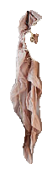

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.92 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.29 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6044


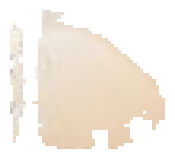

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.3512


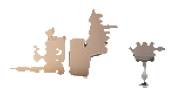

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9401


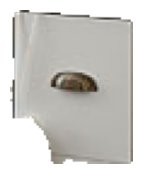

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 1.01 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9717


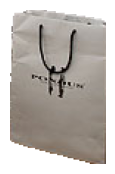

Mask labeling completed in 0.62 seconds
Mask labeling completed in 2.18 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9382


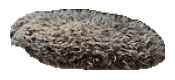

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.81 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9361


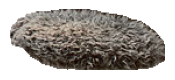

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.39 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9340


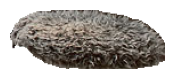

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9616


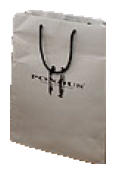

Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9525


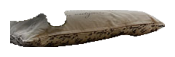

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8754


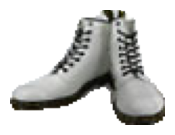

Mask labeling completed in 1.00 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 3.07 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 7, participant 11
	Generating general scene description…
Scene description completed in 9.40 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist aesthetic. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, near the headboard.


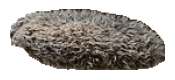

Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.54 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.18 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9744


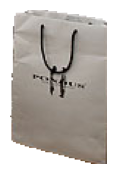

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.34 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8768


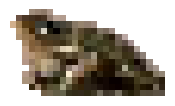

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9714


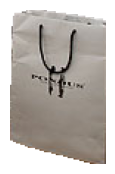

Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9711


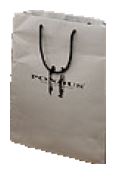

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.38 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5280


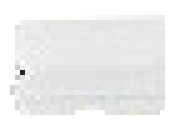

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.52 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 7, participant 12
	Generating general scene description…
Scene description completed in 10.07 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom with a modern and minimalist style. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Two pillows are on the bed, one with a g

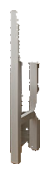

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.78 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8475


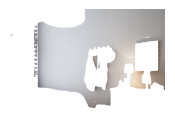

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8479


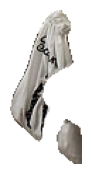

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8559


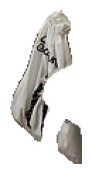

Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 1.63 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9108


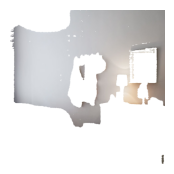

Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7663


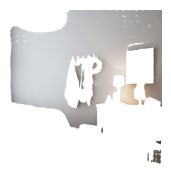

Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.43 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 1.27 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8922


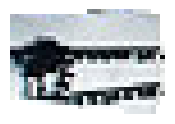

Mask labeling completed in 2.87 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.57 seconds
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Processing image 7, participant 28
	Generating general scene description…
Scene description completed in 11.43 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom with a modern and minimalist design. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, under the throw bl

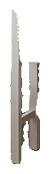

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 2.87 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9067


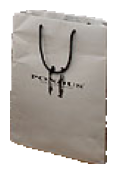

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8198


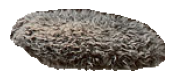

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8513


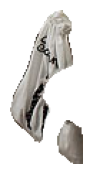

Mask labeling completed in 0.43 seconds
Mask labeling completed in 1.58 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.39 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.45 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6188


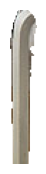

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.4835


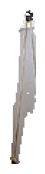

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9248


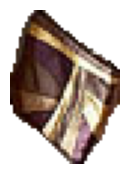

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9553


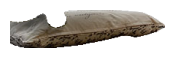

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8967


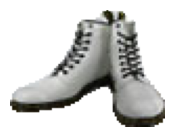

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.95 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 7, participant 29
	Generating general scene description…
Scene description completed in 11.02 seconds
1. **Scene Overview**:
   - The image depicts a cozy and well-decorated bedroom. The room has a soft and inviting atmosphere with a focus on comfort and style.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, near the headboard.
   - **Curtains**: Wh

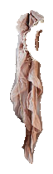

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9907


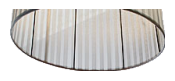

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7966


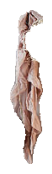

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.19 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9177


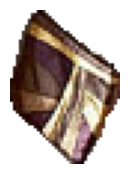

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6212


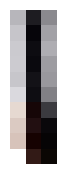

Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8475


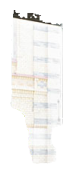

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.50 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 30
	Generating general scene description…
Scene description completed in 16.42 seconds
1. **Scene Overview**:
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist aesthetic. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, with one pillow havi

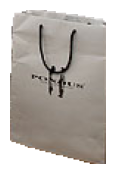

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9641


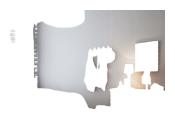

Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 1.20 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7366


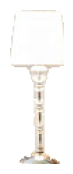

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6355


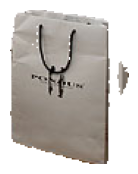

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9194


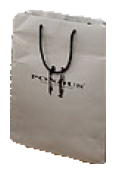

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.70 seconds
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Processing image 7, participant 34
	Generating general scene description…
Scene description completed in 12.48 seconds
1. **Scene Overview**:
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket. A pair of shoes is placed on the

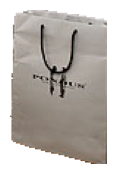

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9417


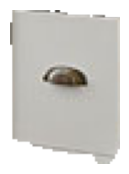

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.48 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.33 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7521


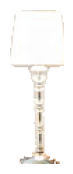

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 1.83 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9339


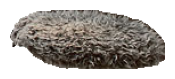

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 2.03 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8429


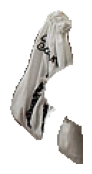

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.78 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5095


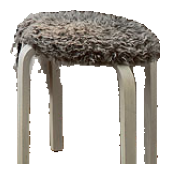

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9526


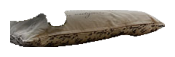

Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8963


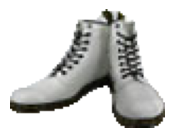

Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6683


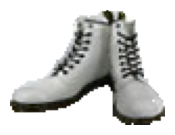

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.81 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 7, participant 35
	Generating general scene description…
Scene description completed in 11.89 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist design. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Two pillows are on the bed, one with a gray cover.
   -

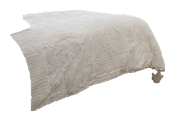

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 2.14 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9747


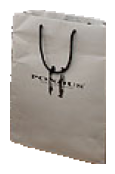

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.00 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7323


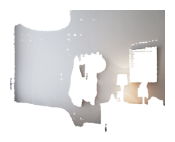

Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9301


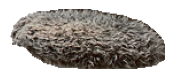

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.55 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5891


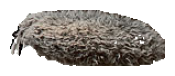

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5698


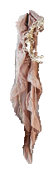

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9757


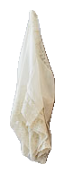

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.46 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 7, participant 36
	Generating general scene description…
Scene description completed in 11.00 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on 

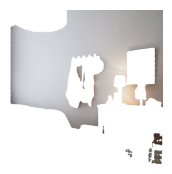

Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.39 seconds
Mask labeling completed in 1.83 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.64 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9478


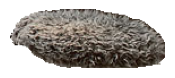

Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7880


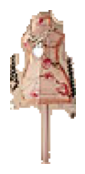

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9281


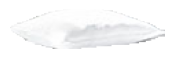

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.55 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 7, participant 40
	Generating general scene description…
Scene description completed in 10.66 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist aesthetic. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: On the bed, near the headboard.
   - **

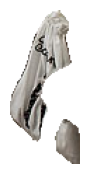

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9655


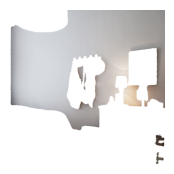

Mask labeling completed in 1.53 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9622


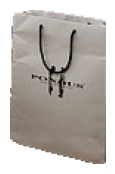

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5095


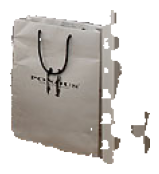

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.48 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 7, participant 41
	Generating general scene description…
Scene description completed in 10.61 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom with a modern and minimalist design. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Two pillows are on the bed, one with a whi

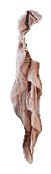

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 2.57 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.35 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9303


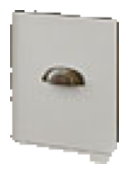

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.4689


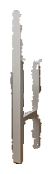

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.84 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8137


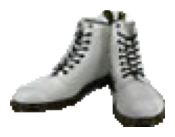

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.56 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 42
	Generating general scene description…
Scene description completed in 9.09 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a soft and inviting atmosphere. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, with one pillow havi

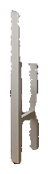

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.84 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9297


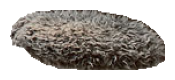

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.84 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9170


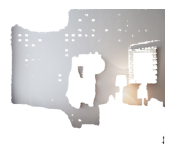

Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9162


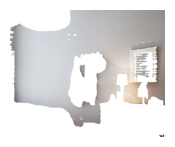

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7876


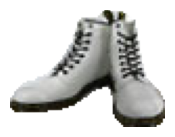

Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.58 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 7, participant 46
	Generating general scene description…
Scene description completed in 8.58 seconds
1. **Scene Overview**:
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist style. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side, covered with white bedding and a gray patterned throw blanket. A pair of shoes is placed on the bed.
   - **Curtains**: White curtains hanging

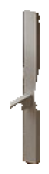

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9597


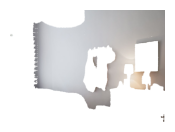

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.06 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.7732


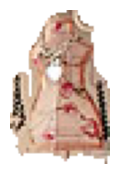

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9363


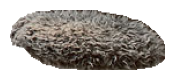

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.88 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9352


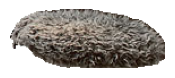

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8089


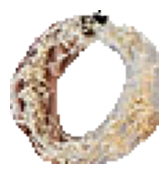

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8823


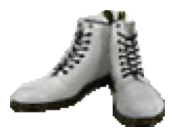

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.42 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 7, participant 47
	Generating general scene description…
Scene description completed in 13.93 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray knitted throw.
   - **Pillows**: Positioned on the bed, n

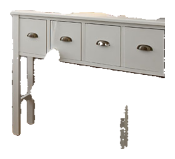

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.46 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.4449


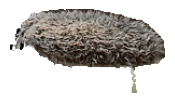

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9316


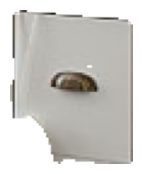

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9334


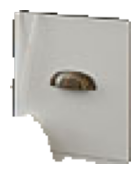

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.74 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8512


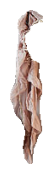

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9049


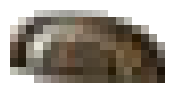

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.2388


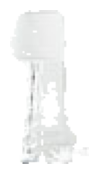

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.51 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 48
	Generating general scene description…
Scene description completed in 12.90 seconds
1. **Scene Overview**:
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on t

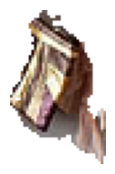

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 2.36 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9681


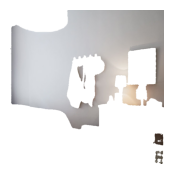

Mask labeling completed in 1.16 seconds
Mask labeling completed in 4.13 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 1.47 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 1.35 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 1.08 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9400


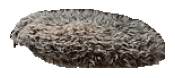

Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.8056


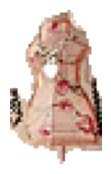

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8967


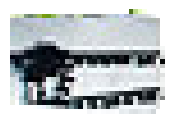

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.51 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 52
	Generating general scene description…
Scene description completed in 16.07 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on 

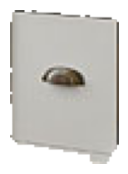

Mask labeling completed in 0.91 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8509


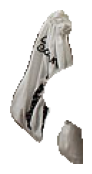

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8632


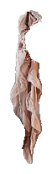

Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7920


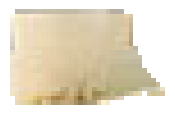

Mask labeling completed in 1.65 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6748


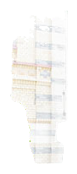

Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.51 seconds
Mask labeling completed in 1.52 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.65 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 7, participant 53
	Generating general scene description…
Scene description completed in 12.47 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on 

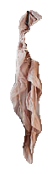

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.74 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9391


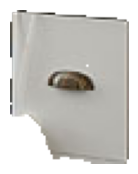

Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8631


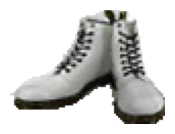

Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 2.85 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.48 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 54
	Generating general scene description…
Scene description completed in 10.35 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a soft and inviting atmosphere. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a patterned throw blanket.
   - **Pillows**: Positioned on the bed, with a pair of shoes pla

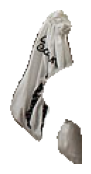

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9717


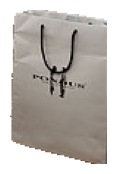

Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.35 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8435


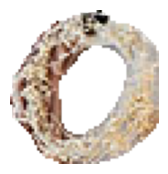

Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8434


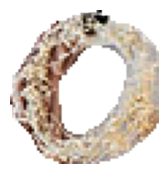

Mask labeling completed in 1.46 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.74 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5341


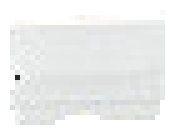

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 1.50 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 58
	Generating general scene description…
Scene description completed in 18.52 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom with a soft, neutral color palette. The room appears to be designed for comfort and relaxation.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket. A pair of shoes is placed on the bed.
   - **Curtains**: White cu

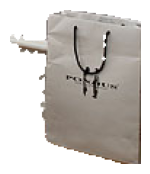

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.68 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9371


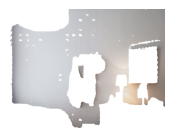

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.68 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 1.19 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.73 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8902


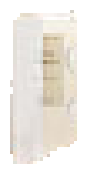

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8432


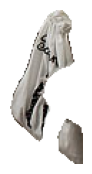

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7584


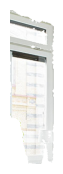

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.70 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 7, participant 59
	Generating general scene description…
Scene description completed in 10.04 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist design. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a patterned throw blanket.
   - **Pillows**: Two pillows are on the bed, one with a knitted 

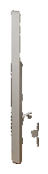

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9272


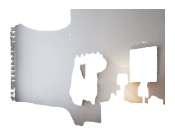

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.68 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8398


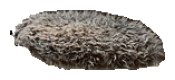

Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5268


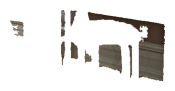

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 1.27 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8586


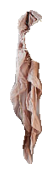

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.18 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8819


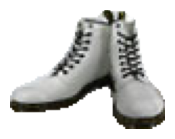

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.04 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 60
	Generating general scene description…
Scene description completed in 13.51 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom with a modern and minimalist design. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, near the foot.
 

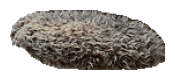

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9754


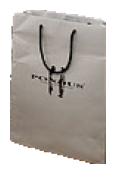

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9222


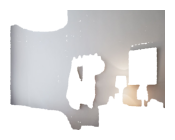

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7674


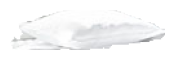

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8921


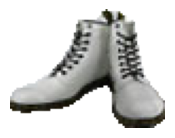

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.97 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 7, participant 64
	Generating general scene description…
Scene description completed in 14.12 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom with a soft and inviting atmosphere. The room is neatly organized and features a combination of modern and classic decor elements.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a patterned throw blanket.
   - **Pillows**: Positioned on the

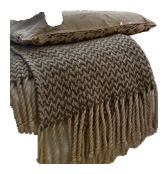

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9559


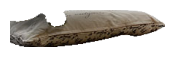

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 7, participant 67
	Generating general scene description…
Scene description completed in 11.31 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a soft and inviting atmosphere. The room is designed with a minimalist and elegant style.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, with a pair of shoes placed 

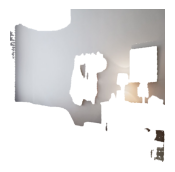

Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9539


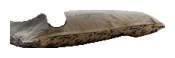

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8588


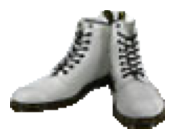

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.49 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 69
	Generating general scene description…
Scene description completed in 11.08 seconds
1. **Scene Overview**:
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist design. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side, covered with white bedding and a gray patterned throw blanket. A pair of shoes is placed on the bed.
   - **Window**: Positioned on the far 

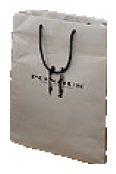

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8550


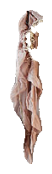

Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5898


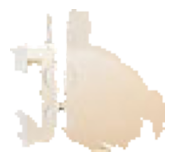

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 1.43 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8080


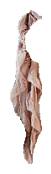

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8949


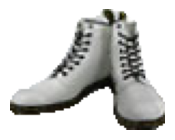

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.75 seconds
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Processing image 7, participant 77
	Generating general scene description…
Scene description completed in 10.39 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a soft and inviting atmosphere. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, with a pair of sho

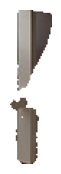

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9263


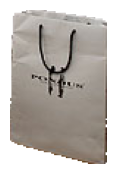

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5450


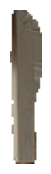

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7985


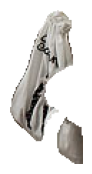

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 4.02 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 4.44 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 2.05 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8535


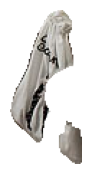

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8551


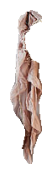

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 4.43 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8979


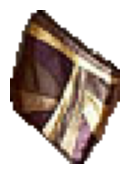

Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9277


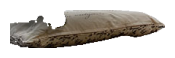

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.39 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8803


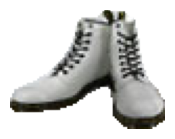

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.44 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 7, participant 83
	Generating general scene description…
Scene description completed in 13.74 seconds
1. **Scene Overview**:
   - The image depicts a cozy, well-decorated bedroom with a soft and inviting atmosphere. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, with a pair of shoes

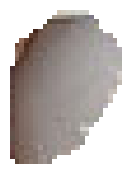

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8496


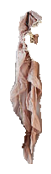

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9814


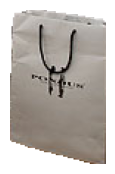

Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 2.58 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8981


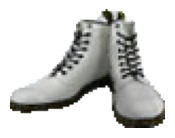

Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.18 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 7, participant 85
	Generating general scene description…
Scene description completed in 11.80 seconds
1. **Scene Overview**:
   - The image depicts a cozy, well-decorated bedroom with a soft and inviting atmosphere. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, with one having a decor

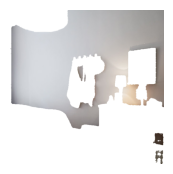

Mask labeling completed in 0.77 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 2.67 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 1.48 seconds
Mask labeling completed in 0.76 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5237


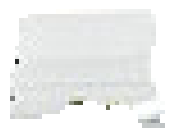

Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.33 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 7, participant 87
	Generating general scene description…
Scene description completed in 9.28 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, well-decorated bedroom with a soft and inviting atmosphere. The room is bright, with natural light coming in from a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side, covered with white bedding and a patterned throw blanket.
   - **Pillows**: Positioned on the bed, near the headboard.
   - **Window**: On t

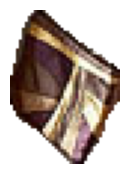

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9712


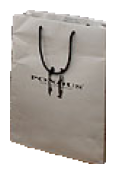

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9365


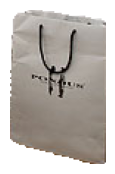

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.93 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9351


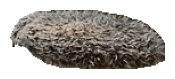

Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7576


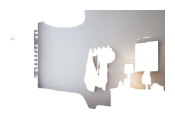

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.24 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8816


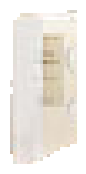

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8959


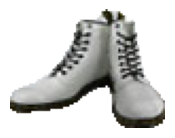

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.77 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 7, participant 89
	Generating general scene description…
Scene description completed in 10.12 seconds
1. **Scene Overview**:
   - The image depicts a cozy, well-decorated bedroom with a modern and minimalist aesthetic. The room is bright, with natural light coming through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on the bed, with a pair of shoes

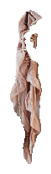

Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5162


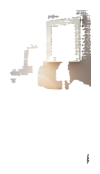

Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.60 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.7076


Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.63 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9120


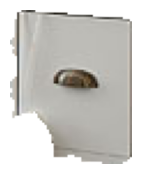

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8975


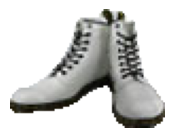

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.56 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 7, participant 97
	Generating general scene description…
Scene description completed in 18.73 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on 

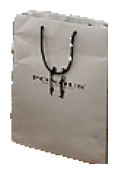

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9321


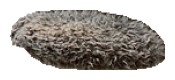

Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 2.79 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9324


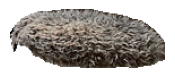

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 6.18 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7789


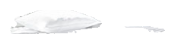

Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.62 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 7, participant 99
	Generating general scene description…
Scene description completed in 13.41 seconds
1. **Scene Overview**:
   - The image depicts a cozy and well-decorated bedroom with a soft and inviting atmosphere. The room is bright, with natural light coming in through a window.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a patterned throw blanket.
   - **Pillows**: Positioned on the bed, with one pillow having

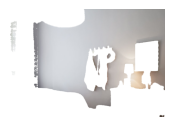

Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 1.47 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 1.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6321


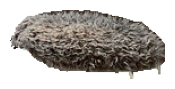

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 3.01 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9729


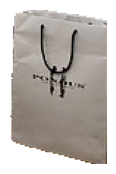

Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5135


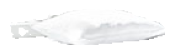

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 2.18 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.69 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 7, participant 101
	Generating general scene description…
Scene description completed in 15.94 seconds
1. **Scene Overview**:
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on 

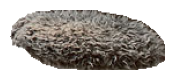

Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9101


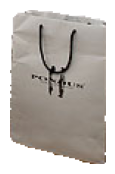

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.5683


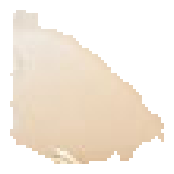

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.8618


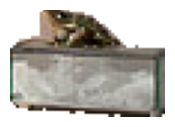

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.5045


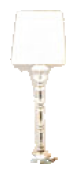

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.94 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9541


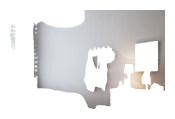

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.63 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 7, participant 103
	Generating general scene description…
Scene description completed in 16.37 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray knitted throw blanket. A pair of shoes is placed on the 

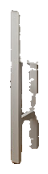

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8089


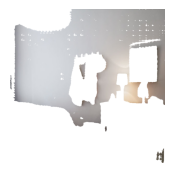

Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 1.13 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9621


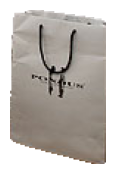

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8324


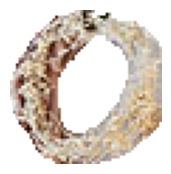

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9192


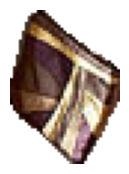

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8844


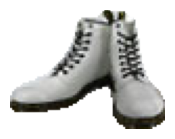

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.24 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.68 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 7, participant 105
	Generating general scene description…
Scene description completed in 9.67 seconds
1. **Scene Overview**:
   - The image depicts a cozy and well-decorated bedroom. The room has a soft, neutral color palette with a focus on white and light gray tones, creating a calm and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side of the image, covered with white bedding and a gray patterned throw blanket.
   - **Pillows**: Positioned on t

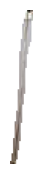

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.85 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9694


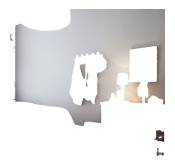

Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.68 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9543


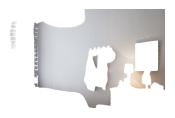

Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 1.57 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 5
	Generating general scene description…
Scene description completed in 17.39 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain gr

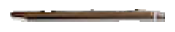

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.65 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9620


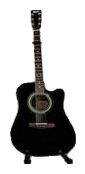

Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 3.58 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.41 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 8, participant 6
	Generating general scene description…
Scene description completed in 12.37 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffee

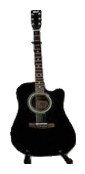

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 2.18 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9543


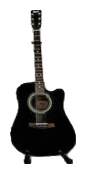

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 2.42 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9819


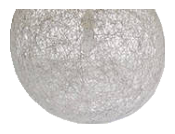

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8445


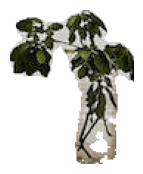

Mask labeling completed in 2.28 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9441


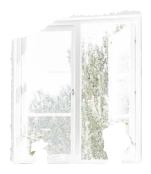

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7337


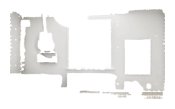

Mask labeling completed in 1.17 seconds
Mask labeling completed in 1.37 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.43 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9541


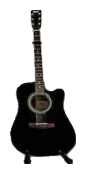

Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.72 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 22
	Generating general scene description…
Scene description completed in 16.21 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish setting.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain gray 

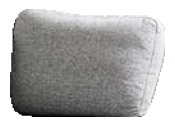

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9628


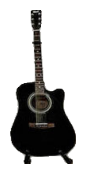

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.43 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 23
	Generating general scene description…
Scene description completed in 12.87 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

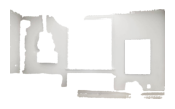

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.08 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 24
	Generating general scene description…
Scene description completed in 16.18 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

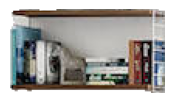

Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.55 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 28
	Generating general scene description…
Scene description completed in 14.47 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located on the left side of the image, it is a light gray sectional with a few decorative pillows.
   - **Coffee Tab

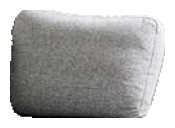

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8041


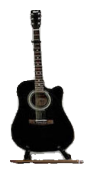

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 7.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.63 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 8, participant 29
	Generating general scene description…
Scene description completed in 21.83 seconds
1. **Scene Overview**:
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffee Table**: In front of the sofa,

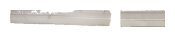

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8254


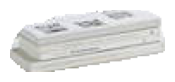

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.3149


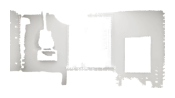

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.93 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 30
	Generating general scene description…
Scene description completed in 14.11 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffee Table**: In front of the sofa

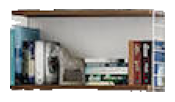

Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.41 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.53 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 8, participant 34
	Generating general scene description…
Scene description completed in 14.70 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

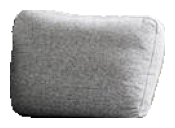

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9210


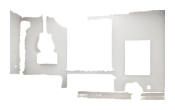

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.57 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.79 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7796


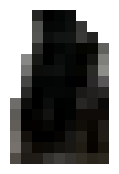

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9036


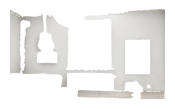

Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8890


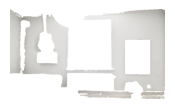

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.56 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 1.48 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 8, participant 35
	Generating general scene description…
Scene description completed in 16.80 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffee Table**: In front of the sofa

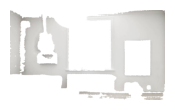

Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.90 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9233


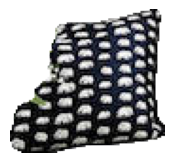

Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 2.16 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9518


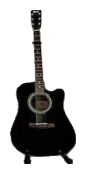

Mask labeling completed in 1.44 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 8, participant 36
	Generating general scene description…
Scene description completed in 15.22 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

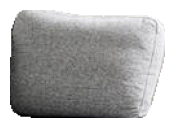

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5383


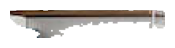

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9710


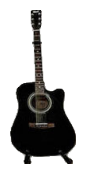

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.72 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 40
	Generating general scene description…
Scene description completed in 13.16 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

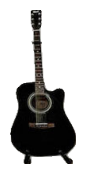

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.63 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 41
	Generating general scene description…
Scene description completed in 16.89 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: A light gray sectional sofa located in the bottom left corner.
   - **Cushions**: A mix of patterned and plain cushions on the sofa.
   - **Coffee 

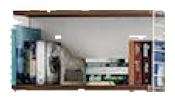

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.45 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 8, participant 42
	Generating general scene description…
Scene description completed in 18.22 seconds
1. **Scene Overview**:
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffee

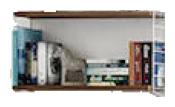

Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.79 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9529


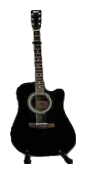

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.79 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8713


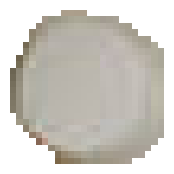

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.41 seconds
Participant data before center bias removal:  1
Participant data after center bias removal:  0
Processing image 8, participant 46
	Generating general scene description…
Scene description completed in 11.42 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffe

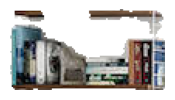

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.72 seconds
Participant data before center bias removal:  31
Participant data after center bias removal:  30
Processing image 8, participant 48
	Generating general scene description…
Scene description completed in 15.55 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Cof

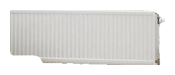

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.51 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 2.45 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8124


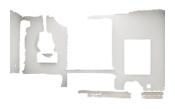

Mask labeling completed in 0.55 seconds
Mask labeling completed in 2.95 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9254


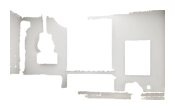

Mask labeling completed in 1.08 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.96 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.3210


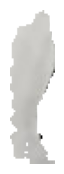

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9849


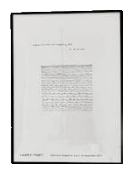

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9870


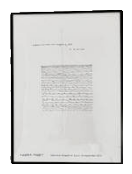

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8846


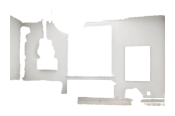

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 1.31 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 1.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9552


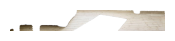

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.61 seconds
Mask labeling completed in 1.02 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7062


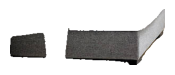

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 1.20 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.77 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9685


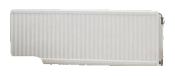

Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9263


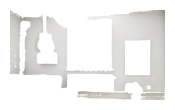

Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.54 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9694


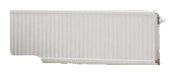

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.68 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9850


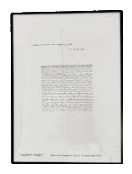

Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9284


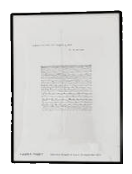

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 4.90 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9446


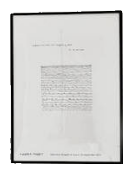

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9850


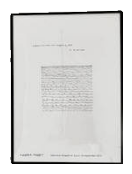

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 1.74 seconds
Mask labeling completed in 1.43 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.73 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9865


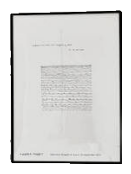

Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9227


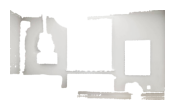

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.37 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.78 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9156


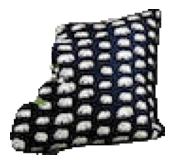

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8737


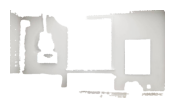

Mask labeling completed in 0.84 seconds
Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 1.85 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 1.12 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.3249


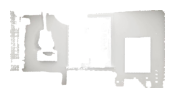

Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.4716


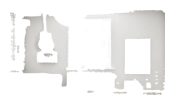

Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 2.54 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5759


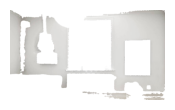

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.70 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.27 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9775


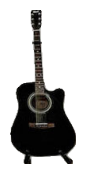

Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9233


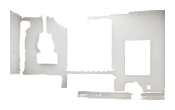

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8298


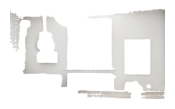

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 1.19 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.85 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9667


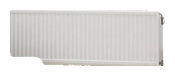

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8382


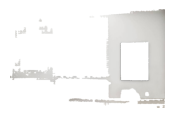

Mask labeling completed in 1.95 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9108


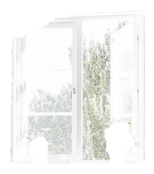

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6260


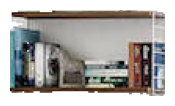

Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.45 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 52
	Generating general scene description…
Scene description completed in 14.17 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located on the left side of the image, a light gray sectional sofa with a black and white patterned pillow.
   - **C

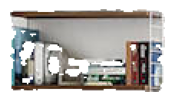

Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.74 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 53
	Generating general scene description…
Scene description completed in 15.65 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

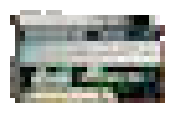

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9583


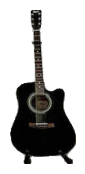

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.79 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 54
	Generating general scene description…
Scene description completed in 13.43 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: A gray sectional sofa located in the bottom left corner.
   - **Cushions**: A few decorative cushions on the sofa, including a black and white patt

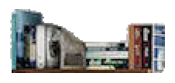

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 58
	Generating general scene description…
Scene description completed in 12.08 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

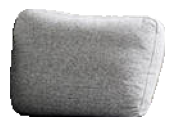

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.68 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9744


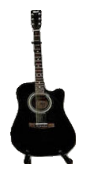

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 4.25 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.68 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 59
	Generating general scene description…
Scene description completed in 14.03 seconds
1. **Scene Overview**:
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Positioned in the lower left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coff

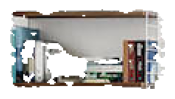

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 2.55 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.33 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9724


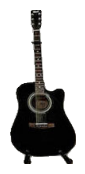

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.99 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 8, participant 60
	Generating general scene description…
Scene description completed in 12.33 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffe

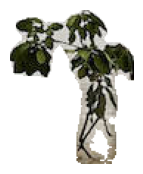

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9353


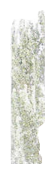

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9502


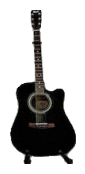

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 2.06 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.65 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 64
	Generating general scene description…
Scene description completed in 11.94 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffe

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.79 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 67
	Generating general scene description…
Scene description completed in 14.87 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

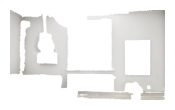

Mask labeling completed in 0.98 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.93 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9690


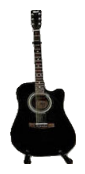

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 1.36 seconds
Mask labeling completed in 0.47 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 69
	Generating general scene description…
Scene description completed in 16.79 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located on the left side of the image, a light gray sectional sofa with a black and white patterned pillow.
   - **C

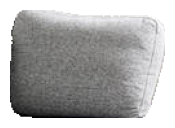

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 2.76 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9569


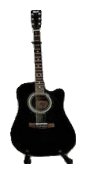

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 75
	Generating general scene description…
Scene description completed in 17.81 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

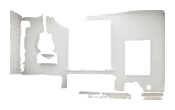

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.86 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 8, participant 77
	Generating general scene description…
Scene description completed in 15.31 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain g

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9623


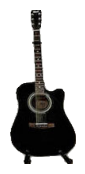

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.89 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9618


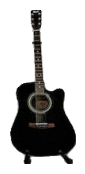

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9558


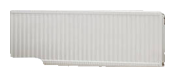

Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.42 seconds
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Processing image 8, participant 83
	Generating general scene description…
Scene description completed in 13.27 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow and a plain

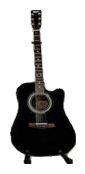

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 6.40 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.4665


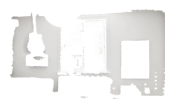

Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.31 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 1.64 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.92 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8936


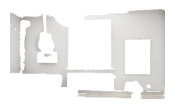

Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8908


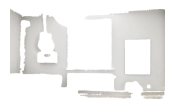

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.37 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7712


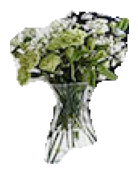

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.39 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8905


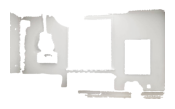

Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 3.64 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.87 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9711


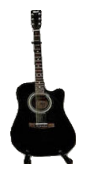

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 1.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.08 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8778


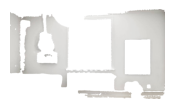

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8222


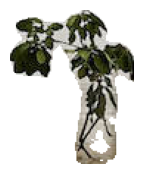

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9110


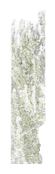

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.54 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6743


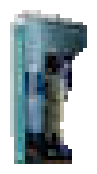

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7242


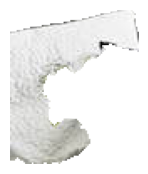

Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.92 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 8, participant 85
	Generating general scene description…
Scene description completed in 19.11 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffe

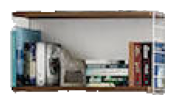

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.51 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.12 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8808


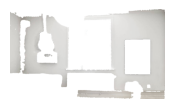

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.44 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 8, participant 87
	Generating general scene description…
Scene description completed in 14.95 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffee Table**: In front of the sofa

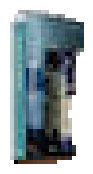

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.42 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 2.84 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.87 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 8, participant 89
	Generating general scene description…
Scene description completed in 15.74 seconds
1. **Scene Overview**: 
   - The image depicts a modern, minimalist living room with a bright and airy atmosphere. The room features a combination of functional and decorative elements, creating a cozy and stylish environment.

2. **Identified Objects**:
   - **Sofa**: Located in the bottom left corner, a light gray sectional sofa with a black and white patterned pillow.
   - **Coffe

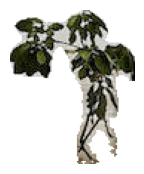

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 2.59 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8191


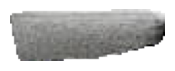

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 4.04 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.88 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5504


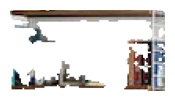

Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.19 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 1.67 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billi

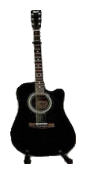

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.27 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.78 seconds
Mask labeling completed in 2.05 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billi

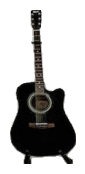

Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.72 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.71 seconds
Mask labeling completed in 2.34 seconds
Mask labeling completed in 0.75 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billi

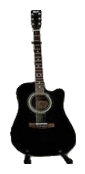

Mask labeling completed in 2.01 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.66 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.58 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.71 seconds
Error in mask labeling: Error code: 429 - {'error'

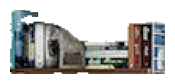

Mask labeling completed in 1.91 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.07 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-e

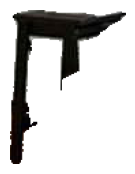

Mask labeling completed in 0.49 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.01 seconds
Mask labeling completed in 2.23 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.24 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billi

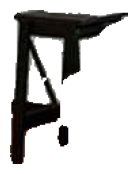

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.51 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

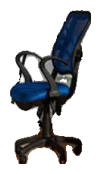

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.39 seconds
Mask labeling completed in 1.03 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-e

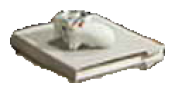

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.60 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-e

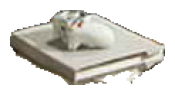

Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.64 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.74 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this

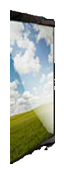

Mask labeling completed in 0.93 seconds
Mask labeling completed in 1.82 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.46 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.22 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 2.07 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.92 seconds
Processing

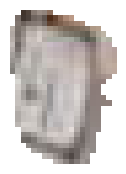

Mask labeling completed in 0.86 seconds
Mask labeling completed in 2.29 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.00 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.

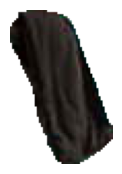

Mask labeling completed in 2.40 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.75 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.

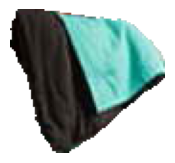

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.50 seconds
Mask labeling completed in 2.74 seconds
Mask labeling completed in 2.41 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 1.28 seconds
Error in mask labeling: Error code: 429 - {'error'

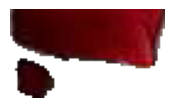

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.05 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.08 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-e

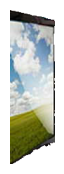

Mask labeling completed in 2.00 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

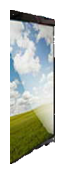

Mask labeling completed in 1.88 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.61 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.46 seconds
Error in mask labeling: Error code: 429 - {'error'

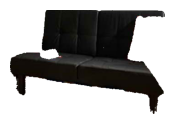

Mask labeling completed in 0.51 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 2.19 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billi

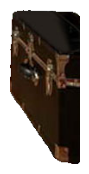

Mask labeling completed in 1.28 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.01 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-e

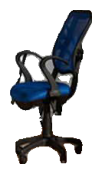

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.28 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.

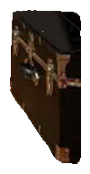

Mask labeling completed in 1.98 seconds
Mask labeling completed in 1.25 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.91 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this

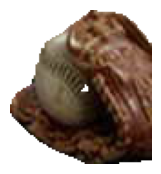

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 1.89 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.98 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8759


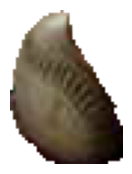

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.60 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.95 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.42 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this

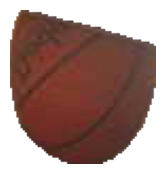

Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.65 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.83 seconds
Mask labeling completed in 2.16 seconds
Mask labeling completed in 2.17 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.63 seconds
Error in mask labeling: Error code: 429 - {'error'

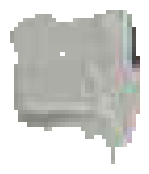

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.66 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-e

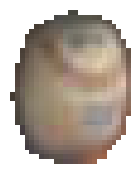

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.23 seconds
Mask labeling completed in 2.01 seconds
Mask labeling completed in 1.02 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.

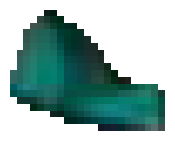

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.37 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

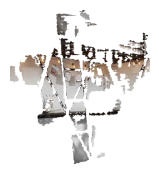

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.72 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

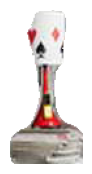

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.07 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

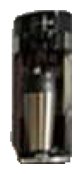

Mask labeling completed in 0.63 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

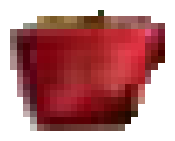

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.13 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

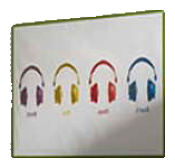

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.90 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.68 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.

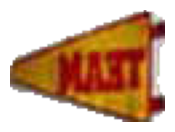

Mask labeling completed in 1.80 seconds
Mask labeling completed in 4.80 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.23 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billi

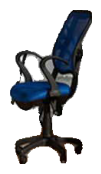

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.96 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.

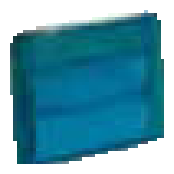

Mask labeling completed in 0.41 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.38 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this

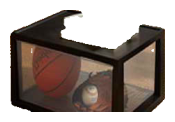

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 1.98 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.26 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.99 seconds
Processing

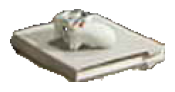

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.09 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

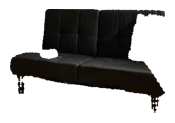

Mask labeling completed in 0.97 seconds
Mask labeling completed in 1.27 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.80 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.95 seconds
Mask labeling completed in 1.18 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billi

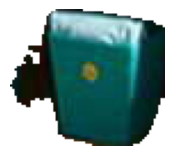

Mask labeling completed in 1.72 seconds
Mask labeling completed in 2.34 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.62 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.18 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 2.32 seconds
Error in mask labeling: Error code: 429 - {'error'

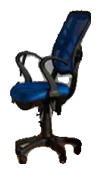

Mask labeling completed in 1.85 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.18 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-e

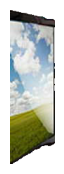

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.10 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 1.38 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.40 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this

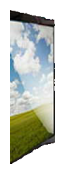

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.24 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

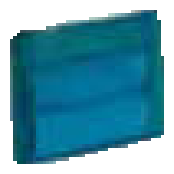

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.08 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

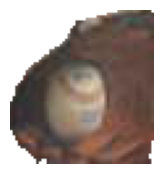

Mask labeling completed in 0.71 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', '

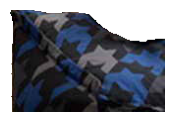

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

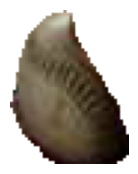

Mask labeling completed in 0.92 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 2.01 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.72 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this

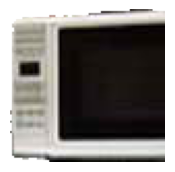

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

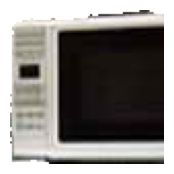

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 0.99 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Mask labeling completed in 1.98 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.47 seconds
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this

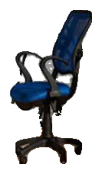

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

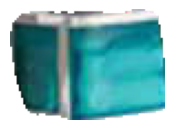

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

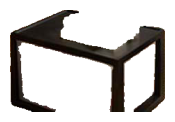

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

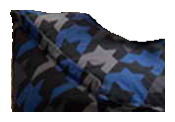

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

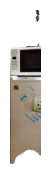

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

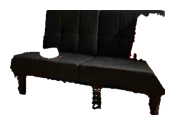

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

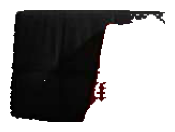

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

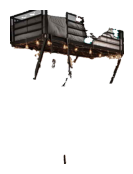

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

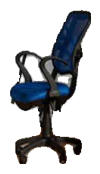

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

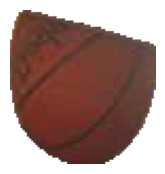

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

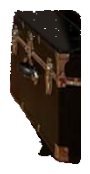

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

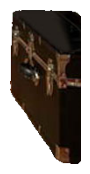

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

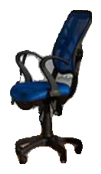

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

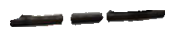

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

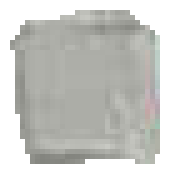

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

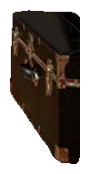

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

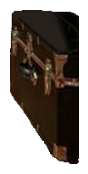

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

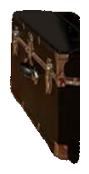

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

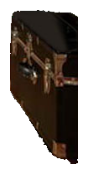

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

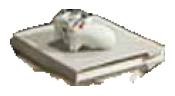

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

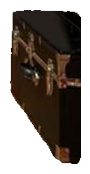

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

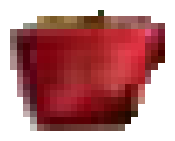

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

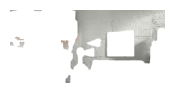

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

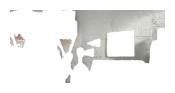

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

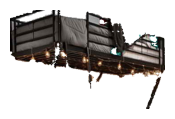

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

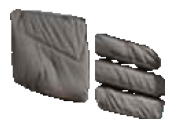

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

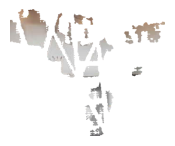

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

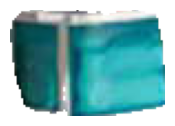

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

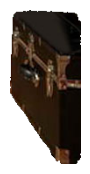

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

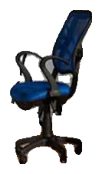

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

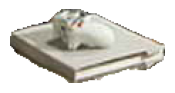

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

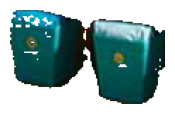

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

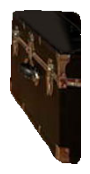

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

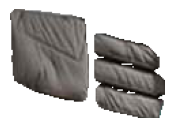

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

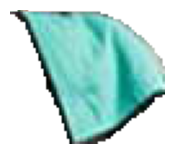

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

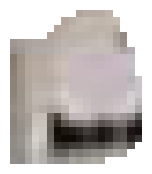

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

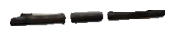

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

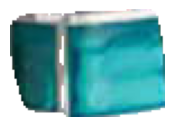

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

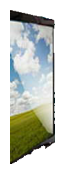

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

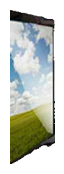

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

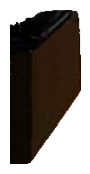

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

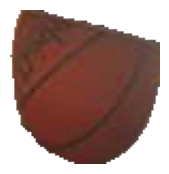

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

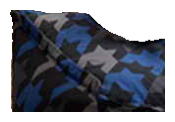

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

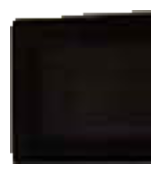

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

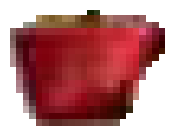

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

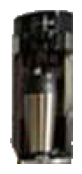

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

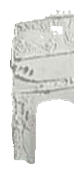

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

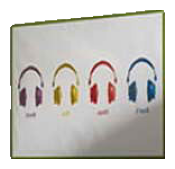

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

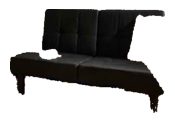

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

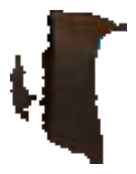

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

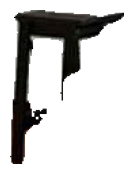

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

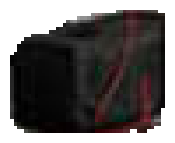

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

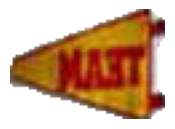

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

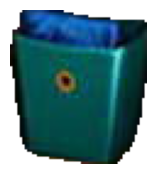

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

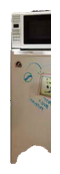

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

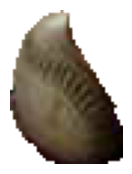

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

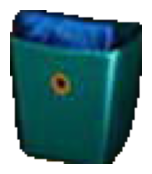

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

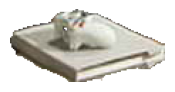

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

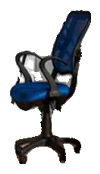

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

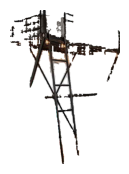

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

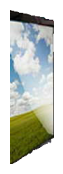

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

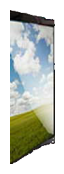

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

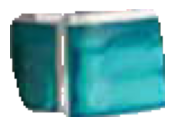

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

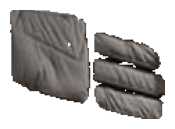

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

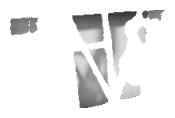

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

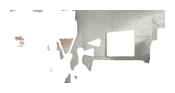

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

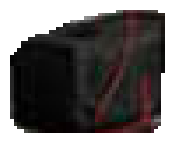

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

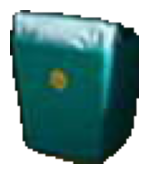

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

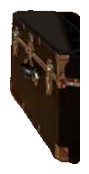

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

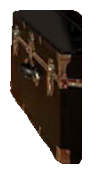

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

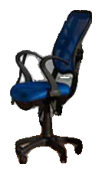

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

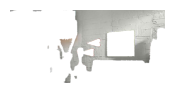

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

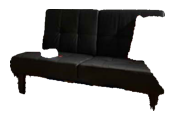

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

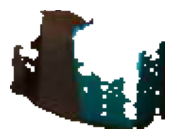

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

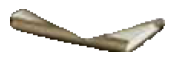

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

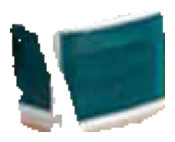

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

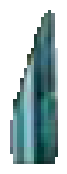

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

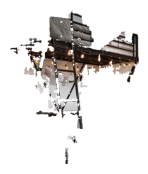

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

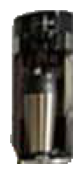

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

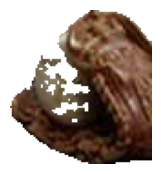

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

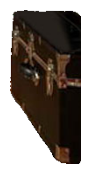

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

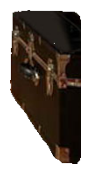

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

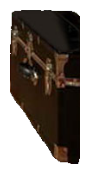

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

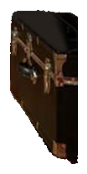

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

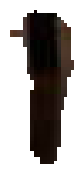

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

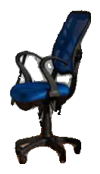

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

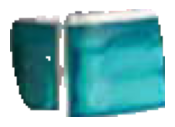

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

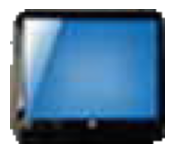

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

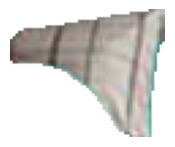

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

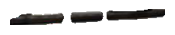

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

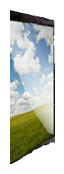

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

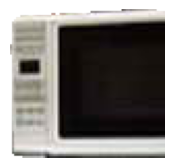

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

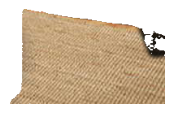

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

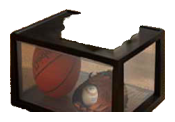

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

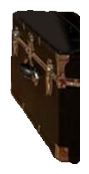

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

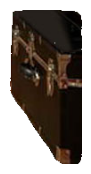

Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}
Error in mask labeling: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quot

EOFError: 

In [17]:
import os
import glob
import time
import pandas as pd

from src.core.Participant import Participant
from src.core.ImageData   import ImageData
from src.core.FixationTask  import FixationTask
from src.models.MaskGenerator import SAM2
from src.prompts.gaze_prompts import *  

# load the experiment data
datapath = os.path.join("data", "experiments", "XSQ_Expt1_Data_All.csv")
data     = pd.read_csv(datapath)
CONDITION_ID = 3
GROUP_ID     = 2
EXP_TYPE     = "unexp"

# 1) subset to Group 2 & Condition 3
subset = data[
    (data["Condition"] == CONDITION_ID) &
    (data["Group"]     == GROUP_ID)
]

# 2) pick the first 30 image IDs from that subset
first_30_images = sorted(subset["ItemNum"].unique())[:30]
print("Will process images:", first_30_images)

# 3) loop over those 30 images
for img_id in first_30_images:
    imgpath = os.path.join(IMAGE_DIR, f"{img_id}{EXP_TYPE}.jpg")
    if not os.path.isfile(imgpath):
        print(f"Warning: {imgpath} not found, skipping image {img_id}.")
        continue

    imageData = ImageData(imgpath, img_type=EXP_TYPE)

    # 4) loop over every participant who saw this image
    participants = subset.loc[subset.ItemNum == img_id, "ParticipantID"].unique()
    for part_ID in participants:
        participant = Participant(int(part_ID))

        task = FixationTask(
            participant,
            imageData,
            data,                # full data; will be re-filtered inside
            condition=CONDITION_ID,
            group=GROUP_ID,
            rows_per_second=1
        )

        task_data = task.data

        print(f"Processing image {img_id}, participant {part_ID}")
        print("\tGenerating general scene description…")
        llm = create_llm_instance("openai", "gpt-4o", temperature=0.1)
        
        try:
            scene_description = llm.describe_scene(imageData)
        except Exception as e:
            print(f"Scene description failed for image {img_id} (participant {part_ID}): {e}")
            continue  # skip this image/participant if LLM fails
        print(scene_description)

        mask_gen = SAM2(
            sam_model_path   = SAM_MODEL,
            sam_model_config = SAM_CONFIG,
            task             = task
        )

        for fix_indx in task_data.index:
            pattern = os.path.join(
                RESULTS_DIR, "Masks", "**",
                f"IMG_{img_id}_type_{EXP_TYPE}_Part_{part_ID}_MASK_{fix_indx}_best_*_mask_*.png"
            )
            if glob.glob(pattern, recursive=True):
                print(f"  ↳ Skipping fixation {fix_indx} (already done)")
                continue

            fix_prompt = task_data.iloc[fix_indx]

            mask = mask_gen.compute_masks_with_prompt(
                fix_indx,
                fix_prompt,
                output_path=os.path.join(RESULTS_DIR, "Masks"),
                DEBUG=True,
                save_mask=True
            )
            mask.plot()

            # safer label loop
            mask_labels = []
            for i in range(10):
                tries = 0
                while tries < 3:
                    try:
                        label = llm.label_mask(mask, imageData, use_context=True, context=scene_description)
                        mask_labels.append(label)
                        break  # success
                    except Exception as e:
                        tries += 1
                        print(f"Error labeling fixation {fix_indx}, try {tries}/3: {e}")
                        time.sleep(2)  # backoff before retry
                else:
                    print(f"Failed to label fixation {fix_indx} after 3 tries, skipping.")

            mask.labels = mask_labels

            mask_gen.save_mask_object(
                mask,
                mask.path.replace(".png", "")
            )


In [19]:
mask.path

'./outputs/Masks/BestMask/IMG_9_type_unexp_Part_35_MASK_11_best_point_mask_0.8799.png'

In [24]:
os.path.exists(".\\outputs\\Masks\\BestMask\\IMG_1_type_unexp_Part_5_MASK_1_best_point_mask_0.7331.png")

False

In [25]:
import pickle
with open(mask.path.replace(".png", ".pkl"), 'rb') as f:
    new_mask = pickle.load(f)


In [26]:
new_mask.labels

["Error: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}",
 "Error: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}",
 "Error: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, read the docs: https://platform.openai.com/docs/guides/error-codes/api-errors.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}",
 "Error: Error code: 429 - {'error

In [ ]:

# get the directory path from the mask_filename_path
directory_path = os.path.dirname(mask.path)
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Save the complete Mask object as pickle
with open(mask.path + ".pkl", 'wb') as f:
    pickle.dump(mask_object, f)

# Save the cropped image with alpha as PNG
Image.fromarray(mask_object.cropped_image_with_alpha).save(mask_filename_path+".png")


In [ ]:
mask.labels

In [ ]:
mask = mask_gen.compute_masks_with_prompt(1,prompt_1, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask.plot()

# generate label candidates for the mask
mask_labels = []
for i in range(0, 10):  # asking the LLM to label the image 10x so we can get a distribution of labels
    mask_label = llm.label_mask(mask, imageData, use_context = True, context = scene_description) 
    mask_labels.append(mask_label)
mask_labels


Cheking another participant doing a fixation task on IMG 1

In [ ]:
mask = mask_gen.compute_masks_with_prompt(2,prompt_2, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask.plot()

# generate label candidates for the mask
mask_labels = []
for i in range(0, 10):  # asking the LLM to label the image 10x so we can get a distribution of labels
    mask_label = llm.label_mask(mask, imageData, use_context = True, context = scene_description) 
    mask_labels.append(mask_label)
mask_labels

In [ ]:
IMG_ID = 1
part_ID = int(data[data.ItemNum == IMG_ID].ParticipantID.unique()[1])
participant =  Participant(part_ID)
print("Participant ID:", part_ID)

task2 = FixationTask(participant, imageData, data, condition = CONDITION_ID, group = GROUP_ID, rows_per_second=1)

In [ ]:
task2_data = task2.data.copy()

In [ ]:
prompt_0 = task2_data.iloc[0]
prompt_1 = task2_data.iloc[1]
prompt_2 = task2_data.iloc[2]

In [ ]:
mask_gen2 = SAM2(sam_model_path = SAM_MODEL, sam_model_config = SAM_CONFIG, task = task2)

In [ ]:
mask2 = mask_gen2.compute_masks_with_prompt(0,prompt_0, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask2.plot()
mask_gen2.task.masks

In [ ]:
mask2 = mask_gen2.compute_masks_with_prompt(1,prompt_1, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask2.plot()
mask_gen2.task.masks

In [ ]:
mask2 = mask_gen2.compute_masks_with_prompt(2,prompt_2, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask2.plot()
mask_gen2.task.masks

putting everything into a single dict

In [ ]:
merged = {}
merged[IMG_ID] = {**mask_gen.task.masks, **mask_gen2.task.masks}
merged

## Mask Labeller Test

In [18]:
import pickle

mask_path = "outputs\Masks\BestMask\IMG_1_type_exp_Part_2_MASK_0_best_point_mask_0.8917.pkl"

with open(mask_path, 'rb') as mask_file:
    best_mask = pickle.load(mask_file)

best_mask

FileNotFoundError: [Errno 2] No such file or directory: 'outputs\\Masks\\BestMask\\IMG_1_type_exp_Part_2_MASK_0_best_point_mask_0.8917.pkl'

In [ ]:
best_mask.path

In [ ]:
best_mask.labels